Importamos el dataset de hospitalizaciones

In [334]:
import pandas as pd
import plotly.express as px
from sklearn.preprocessing import OneHotEncoder
from datetime import timedelta, date
import numpy as np
import os

In [68]:
df=pd.read_excel('CMBD_6_20181217-135856.xlsx')

pd.set_option('display.max_rows', 200)
df.head().T

,0,1,2,3,4
Año,2013,2013,2013,2013,2013
Hospital Recodificado,-398345888794880068,-3959599681650518086,-3959599681650518086,-1468647043-245326524,946141513-1168024764
Comunidad Autónoma,13,13,13,13,13
Provincia,28,28,28,28,28
Grupo Hospital,4,3,3,4,3
Grupo Cluster,4,4,4,5,3
Historia Recodificada,-1687781257578748014,166370745435838543,183632305468848809,2877111881585847151,17519509571482774643
CIP Recodificado,-320943158-171303395,648485069584850511,899288196-1988273609,-961279109-1723117644,-33451060035352825
Fecha de nacimiento,10041944,10061937,14111923,10051956,7091928
Sexo,1,1,1,2,1


In [69]:
df.info(verbose=True)

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 140937 entries, 0 to 140936
Data columns (total 66 columns):
 #   Column                    Non-Null Count   Dtype  
---  ------                    --------------   -----  
 0   Año                       140937 non-null  int64  
 1   Hospital Recodificado     140937 non-null  object 
 2   Comunidad Autónoma        140937 non-null  int64  
 3   Provincia                 140937 non-null  int64  
 4   Grupo Hospital            140937 non-null  int64  
 5   Grupo Cluster             140937 non-null  int64  
 6   Historia Recodificada     140937 non-null  object 
 7   CIP Recodificado          140937 non-null  object 
 8   Fecha de nacimiento       140937 non-null  int64  
 9   Sexo                      140937 non-null  int64  
 10  Provincia Residencia      140937 non-null  int64  
 11  Régimen Financiación      140937 non-null  int64  
 12  Fecha de ingreso          140937 non-null  int64  
 13  Tipo Ingreso              140937 non-null  i

In [70]:
df.columns

Index(['Año', 'Hospital Recodificado', 'Comunidad Autónoma', 'Provincia',
       'Grupo Hospital', 'Grupo Cluster', 'Historia Recodificada',
       'CIP Recodificado', 'Fecha de nacimiento', 'Sexo',
       'Provincia Residencia', 'Régimen Financiación', 'Fecha de ingreso',
       'Tipo Ingreso', 'Fecha de alta', 'Tipo Alta', 'Estancia',
       'Diagnóstico Principal', 'Diagnóstico 2', 'Diagnóstico 3',
       'Diagnóstico 4', 'Diagnóstico 5', 'Diagnóstico 6', 'Diagnóstico 7',
       'Diagnóstico 8', 'Diagnóstico 9', 'Diagnóstico 10', 'Diagnóstico 11',
       'Diagnóstico 12', 'Diagnóstico 13', 'Diagnóstico 14',
       'Fecha de Intervención', 'Procedimiento 1', 'Procedimiento 2',
       'Procedimiento 3', 'Procedimiento 4', 'Procedimiento 5',
       'Procedimiento 6', 'Procedimiento 7', 'Procedimiento 8',
       'Procedimiento 9', 'Procedimiento 10', 'Procedimiento 11',
       'Procedimiento 12', 'Procedimiento 13', 'Procedimiento 14',
       'Procedimiento 15', 'Procedimiento 16', 'Pro

In [71]:
df['year'] = df['Fecha de ingreso'].apply(str).str.zfill(8).apply(lambda x: x[4:8])
df['month'] = df['Fecha de ingreso'].apply(str).str.zfill(8).apply(lambda x: x[2:4])
df['day'] = df['Fecha de ingreso'].apply(str).str.zfill(8).apply(lambda x: x[0:2])

df['admission_date'] = pd.to_datetime(df[['year','month','day']],format='%y%M%d')

df.head().T

,0,1,2,3,4
Año,2013,2013,2013,2013,2013
Hospital Recodificado,-398345888794880068,-3959599681650518086,-3959599681650518086,-1468647043-245326524,946141513-1168024764
Comunidad Autónoma,13,13,13,13,13
Provincia,28,28,28,28,28
Grupo Hospital,4,3,3,4,3
Grupo Cluster,4,4,4,5,3
Historia Recodificada,-1687781257578748014,166370745435838543,183632305468848809,2877111881585847151,17519509571482774643
CIP Recodificado,-320943158-171303395,648485069584850511,899288196-1988273609,-961279109-1723117644,-33451060035352825
Fecha de nacimiento,10041944,10061937,14111923,10051956,7091928
Sexo,1,1,1,2,1


# Diagnósticos

In [72]:
enfermedad_pulmonar_obstructiva_cronica = [
    '491.0', '491.1', '491.20', '491.21', '491.22', '491.8', '491.9', '492.0', '492.8', '494', '494.0', '494.1', '496'
]

bronquitis_aguda = [
    '466.0','490'
]

asma = [
    '493.00', '493.01', '493.02', '493.10', '493.11', '493.12', '493.20', '493.21', '493.22', '493.81', '493.82', '493.90', '493.91', '493.92'
]

fibrosis_quistica_o_anomalias_sistema_respiratorio = [
    '277.00', '277.01', '277.02','277.03', '277.09', '516.61','516.62', '516.63', '516.64', '516.69', '747.21', '748.3', '748.4', '748.5', '748.60', '748.61', '748.69', '748.8', '748.9', '750.3', '759.3','770.7'
]

insuficiencia_cardiaca_congestiva = [
    '398.91', '402.01', '402.11', '402.91', '404.01', '404.03', '404.11', '404.13', '404.91', '404.93', '428.0', '428.1', '428.20', '428.21', '428.22', '428.23', '428.30', '428.31', '428.32', '428.33', '428.40', '428.41', '428.42', '428.43', '428.9'
]

hipertension_arterial = [
    '401.0', '401.9', '402.00', '402.10', '402.90', '403.00', '403.10', '403.90', '404.00', '404.10', '404.90'
]

enfermedad_renal = [
    '403.00', '403.10', '403.90', '404.00', '404.10', '404.90'
]

neumonia_bacteriana = [
    '481', '482.2', '482.30', '482,31', '482.32', '482.39', '482.41', '482.42', '482.9', '483.0', '483.1', '483.8', '485', '486'
]

anemia_falciforme_o_enfermedad_hemoglobina_S = [
    '282.41', '282.42', '282.60', '282.61', '282.62', '282.63', '282.64', '282.68', '282.69'
]

diabetes_incontrolada_sin_complicacion = [
    '250.02','250.03'
]

diabetes_con_complicacion_aguda = [
    '250.10', '250,11', '250.12', '250.13', '250.20', '250.21','250.22','250.23', '250.30', '250.31', '250.32', '250.33'
]

diabetes_con_complicacion_cronica = [
    '250.40', '250.41', '250.42', '250.43', '250.50', '250.51', '250.52', '250.53', '250.60', '250.61', '250.62', '250.63', '250.70', '250.71', '250.72', '250.73', '250.80','250.81', '250.82', '250.83', '250.90', '250.91', '250.92', '250.93'
]

infarto_agudo_de_miocardio = [
    '410.01','410.11','410.21','410.31','410.41','410.51','410.71','410.81','410.90','410.91'
]

# Procedimientos

In [73]:
dialisis = [
    '38.95', '39.27', '39.29', '39.42', '39.43', '39.93', '39.94'
]

# Enfermedades

In [74]:
pqi_01_complicaciones_a_corto_plazo_de_la_diabetes = (
    (df['Diagnóstico Principal'].isin(diabetes_con_complicacion_aguda))
    &
    (df['Edad'] >= 15)
)

pqi_03_complicaciones_a_largo_plazo_de_la_diabetes = (
    (df['Diagnóstico Principal'].isin(diabetes_con_complicacion_cronica))
    &
    (df['Edad'] >= 15)
)

pqi_05_enfermedad_pulmonar_obstructiva_cronica_o_asma_en_mayores = (
    (
    (df['Diagnóstico Principal'].isin(enfermedad_pulmonar_obstructiva_cronica)) |
    ((df['Diagnóstico Principal'].isin(bronquitis_aguda)) & (df['Diagnóstico 2'].isin(enfermedad_pulmonar_obstructiva_cronica))) |
    (df['Diagnóstico Principal'].isin(asma))
    ) 
    & 
    (df['Edad'] >= 40) 
    &
    ~(df['Diagnóstico 2'].isin(fibrosis_quistica_o_anomalias_sistema_respiratorio))
)

pqi_07_hipertension_arterial = (
    (df['Diagnóstico Principal'].isin(hipertension_arterial))
    &
    (df['Edad'] >= 15)
    & 
    ~((df['Diagnóstico 2'].isin(enfermedad_renal)) & (df['Procedimiento 1'].isin(dialisis)) )
)

pqi_08_insuficiencia_cardiaca_congestiva  = (
    (df['Diagnóstico Principal'].isin(insuficiencia_cardiaca_congestiva))
    &
    (df['Edad'] >= 15) 
)

pqi_11_neumonia_bacteriana = (
    (df['Diagnóstico Principal'].isin(neumonia_bacteriana))
    &
    (df['Edad'] >= 15)
    & 
    ~(df['Diagnóstico 2'].isin(anemia_falciforme_o_enfermedad_hemoglobina_S))
)

pqi_14_diabetes_incontrolada_sin_complicacion = (
    (df['Diagnóstico Principal'].isin(diabetes_incontrolada_sin_complicacion))
    &
    (df['Edad'] >= 15)
)

pqi_15_asma_en_adultos_jovenes_15_39_anos = (
    (df['Diagnóstico Principal'].isin(asma))
    &
    ((df['Edad'] >= 18) & (df['Edad'] < 39))
    & 
    ~ (
        (df['Diagnóstico Principal'].isin(fibrosis_quistica_o_anomalias_sistema_respiratorio))
        |
        (df['Diagnóstico 2'].isin(fibrosis_quistica_o_anomalias_sistema_respiratorio))
    )
)

hospitalizacion_por_infarto_agudo_de_miocardio = (
    df['Diagnóstico Principal'].isin(infarto_agudo_de_miocardio)
)

## Condiciones crónicas

In [75]:
complicaciones_a_corto_plazo_de_la_diabetes_en_poblacion_infantil = (
    (df['Diagnóstico Principal'].isin(diabetes_con_complicacion_aguda))
    &
    ((df['Edad'] >= 6) & (df['Edad'] < 15))
)

hospitalizacion_por_asma_en_poblacion_infantil = (
    (df['Diagnóstico Principal'].isin(asma))
    &
    ((df['Edad'] >= 2) & (df['Edad'] < 15))
    & 
    ~(
        (df['Diagnóstico Principal'].isin(fibrosis_quistica_o_anomalias_sistema_respiratorio))
        |
        (df['Diagnóstico 2'].isin(fibrosis_quistica_o_anomalias_sistema_respiratorio))
    )
)

In [76]:
pd.set_option('display.max_rows', 200)


Informamos el campo `diagnosis_name` con lo que significa el código de diagnóstico

In [77]:
diagnosis_dict = {
    'enfermedad pulmonar obstructiva cronica': enfermedad_pulmonar_obstructiva_cronica,
    'bronquitis aguda': bronquitis_aguda,
    'asma': asma,
    'fibrosis quistica o anomalias sistema respiratorio': fibrosis_quistica_o_anomalias_sistema_respiratorio,
    'insuficiencia cardiaca congestiva': insuficiencia_cardiaca_congestiva,
    'hipertension arterial': hipertension_arterial,
    'enfermedad renal': enfermedad_renal,
    'neumonia bacteriana': neumonia_bacteriana,
    'anemia falciforme o enfermedad hemoglobina S': anemia_falciforme_o_enfermedad_hemoglobina_S,
    'diabetes incontrolada sin complicacion': diabetes_incontrolada_sin_complicacion,
    'diabetes con complicacion aguda': diabetes_con_complicacion_aguda,
    'diabetes con complicacion cronica': diabetes_con_complicacion_cronica,
    'infarto agudo de miocardio': infarto_agudo_de_miocardio
}

for diagnosis, diagnosis_codes in diagnosis_dict.items():
    df.loc[
        df['Diagnóstico Principal'].isin(diagnosis_codes),
        'diagnosis_name'
    ] = f'{diagnosis}'

df[['Diagnóstico Principal','diagnosis_name']].head()

,Diagnóstico Principal,diagnosis_name
0,428.0,insuficiencia cardiaca congestiva
1,491.21,enfermedad pulmonar obstructiva cronica
2,428.0,insuficiencia cardiaca congestiva
3,428.1,insuficiencia cardiaca congestiva
4,162.5,NaN


Informamos el campo `disease_name` con la enfermedad asociada al código de diagnóstico y la edad del paciente

In [78]:
diseases_filters_dict = {
    'PQI 01 complicaciones a corto plazo de la diabetes': pqi_01_complicaciones_a_corto_plazo_de_la_diabetes,
    'PQI 03 complicaciones a largo plazo de la diabetes': pqi_03_complicaciones_a_largo_plazo_de_la_diabetes,
    'PQI 05 enfermedad pulmonar obstructiva cronica o asma en mayores': pqi_05_enfermedad_pulmonar_obstructiva_cronica_o_asma_en_mayores,
    'PQI 07 hipertension arterial': pqi_07_hipertension_arterial,
    'PQI 08 insuficiencia cardiaca congestiva': pqi_08_insuficiencia_cardiaca_congestiva,
    'PQI 11 neumonia bacteriana': pqi_11_neumonia_bacteriana,
    'PQI 14 diabetes incontrolada sin complicacion': pqi_14_diabetes_incontrolada_sin_complicacion,
    'PQI 15 asma en adultos jovenes 15 39 anos': pqi_15_asma_en_adultos_jovenes_15_39_anos,
    'hospitalizacion por infarto agudo de miocardio': hospitalizacion_por_infarto_agudo_de_miocardio,
    'complicaciones a corto plazo de la diabetes en poblacion infantil': complicaciones_a_corto_plazo_de_la_diabetes_en_poblacion_infantil,
    'hospitalizacion por asma en poblacion infantil': hospitalizacion_por_asma_en_poblacion_infantil
}

for disease, disease_filter in diseases_filters_dict.items():
    df.loc[disease_filter, 'disease_name'] = f'{disease}'

Este es el resultado

In [79]:
df.loc[~df.disease_name.isna(),['admission_date','Diagnóstico Principal','diagnosis_name','disease_name']].sample(20)

,admission_date,Diagnóstico Principal,diagnosis_name,disease_name
686,2013-08-30,492.8,enfermedad pulmonar obstructiva cronica,PQI 05 enfermedad pulmonar obstructiva cronica...
101989,2011-04-14,486,neumonia bacteriana,PQI 11 neumonia bacteriana
55334,2010-12-10,486,neumonia bacteriana,PQI 11 neumonia bacteriana
66452,2011-05-25,493.92,asma,PQI 05 enfermedad pulmonar obstructiva cronica...
15452,2011-08-16,486,neumonia bacteriana,PQI 11 neumonia bacteriana
60770,2010-09-05,491.21,enfermedad pulmonar obstructiva cronica,PQI 05 enfermedad pulmonar obstructiva cronica...
92118,2010-08-07,491.21,enfermedad pulmonar obstructiva cronica,PQI 05 enfermedad pulmonar obstructiva cronica...
37539,2008-11-03,491.21,enfermedad pulmonar obstructiva cronica,PQI 05 enfermedad pulmonar obstructiva cronica...
104187,2011-01-02,493.92,asma,PQI 05 enfermedad pulmonar obstructiva cronica...
11682,2010-12-27,492.8,enfermedad pulmonar obstructiva cronica,PQI 05 enfermedad pulmonar obstructiva cronica...


In [80]:
df.sample(5).T

,67076,13884,83083,30213,2124
Año,2010,2008,2009,2014,2014
Hospital Recodificado,-398345888794880068,-1471938236-1755285183,2017798514694269509,679457089-882872511,-397825696459335749
Comunidad Autónoma,13,13,13,13,13
Provincia,28,28,28,28,28
Grupo Hospital,4,3,4,2,3
Grupo Cluster,4,3,5,3,4
Historia Recodificada,-604431411-1687217379,40795763-2141091471,4380471831483921611,-1334890114-798745785,-551789698278404650
CIP Recodificado,-6147154561666793169,00,-1839259073601860939,1449529705-836191952,-2142112126-773714458
Fecha de nacimiento,16051923,26091924,11021967,3021968,19111935
Sexo,1,1,1,1,1


Nos quedamos solamente con aquellas columnas de interés, y las guardamos en `df_reducido`

In [81]:
df_reducido = df[[
    'Año', 'Hospital Recodificado', 'Grupo Hospital', 'Historia Recodificada', 'CIP Recodificado', 'Fecha de nacimiento' ,
    'Sexo', 'Tipo Ingreso', 'Estancia', 'Valor Peso Español', 'Nivel Mortalidad', 'Nivel Severidad', 
    'Edad', 'Reingreso', 'Coste', 'year', 'month', 'day', 'diagnosis_name', 'disease_name', 'Fecha de ingreso','Fecha de alta']].reset_index()

Estudiamos posibles duplicados

In [82]:
pd.set_option('display.max_rows', None)

In [83]:
# Clave única: 'Hospital Recodificado', 'Historia Recodificada', 'CIP Recodificado','year','month','day'

df_reducido[['Hospital Recodificado', 'Historia Recodificada', 'CIP Recodificado','year','month','day']].value_counts() > 1


Hospital Recodificado   Historia Recodificada   CIP Recodificado        year  month  day
2017798514694269509     -2106632627-1470008464  1363197925-178018594    2011  06     20      True
-3959599681650518086    188654403-1744643538    00                      2012  12     23      True
                        4861956051482186277     00                      2012  02     27      True
                        870499937-670343991     00                      2012  11     10      True
2017798514694269509     1399608120-662937892    1528107549786836730     2014  09     27      True
                        -1021050106-1021672452  1858623777-1285113009   2011  07     03     False
                        -1020460072-1020460072  00                      2008  03     24     False
                        -1020755144-1021967422  00                      2008  10     31     False
                        -1021050095-1021361156  00                      2008  02     03     False
                        -1021

Vemos que los duplicados son reingresos en el mismo día (hay 2 registros: un alta con estancia 0, y otra alta el mismo día con estancia > 0)

In [84]:
df.loc[
    (
    (df['Hospital Recodificado'] == '2017798514694269509') &
    (df['Historia Recodificada'] == '-2106632627-1470008464') &
    (df['CIP Recodificado'] == '1363197925-178018594') &
    (df['year'] == '2011') &
    (df['month'] == '06') &
    (df['day'] == '20' )
    ) | (
    (df['Hospital Recodificado'] == '2017798514694269509') &
    (df['Historia Recodificada'] == '1399608120-662937892') &
    (df['CIP Recodificado'] == '1528107549786836730') &
    (df['year'] == '2014') &
    (df['month'] == '09') &
    (df['day'] == '27' )
    )
    ,  
    :
].T

,60312,64117,79700,129699
Año,2014,2011,2011,2014
Hospital Recodificado,2017798514694269509,2017798514694269509,2017798514694269509,2017798514694269509
Comunidad Autónoma,13,13,13,13
Provincia,28,28,28,28
Grupo Hospital,4,4,4,4
Grupo Cluster,5,5,5,5
Historia Recodificada,1399608120-662937892,-2106632627-1470008464,-2106632627-1470008464,1399608120-662937892
CIP Recodificado,1528107549786836730,1363197925-178018594,1363197925-178018594,1528107549786836730
Fecha de nacimiento,28021925,24031960,24031960,28021925
Sexo,2,1,1,2


In [85]:
df_reducido.loc[df_reducido['Estancia'] == 0].shape

(180, 23)

In [86]:
pd.set_option('display.max_rows', 30)

Nos quedamos con aquellos registros que tienen uno de los diagnósticos o enfermedades de interés, y con estancia distinta de 0 días

In [87]:
df_reducido = df_reducido.loc[
     ~ ( df_reducido['diagnosis_name'].isnull() | df_reducido['disease_name'].isnull() ) & ( df_reducido['Estancia'] != 0 )
     ].drop_duplicates(
        subset=['Hospital Recodificado', 'Historia Recodificada', 'CIP Recodificado','year','month','day'],
        keep='first'
        ).reset_index()

Ahora ya no hay duplicados

In [88]:
df_reducido[['Hospital Recodificado', 'Historia Recodificada', 'CIP Recodificado','year','month','day']].value_counts().sort_values(ascending=False)


Hospital Recodificado  Historia Recodificada   CIP Recodificado       year  month  day
-12004573481717669189  -1690254518796414843    00                     2008  02     08     1
-1201309371979462469   -1019194499-1082499717  12751282521254359397   2015  02     23     1
                       -1019104650-246583711   607277175-1379088191   2014  10     08     1
-12004573481717669189  1933597551561637502     00                     2008  02     24     1
                       325127026846952063      00                     2008  02     27     1
                                                                                         ..
947054971-161377467    979714632-798700703     -286400542-52237964    2015  05     26     1
                       980234565409303415      -16802368141805276751  2014  04     27     1
                       9803820631651456621     -17111964981757356590  2010  02     21     1
                       980609146644088673      816286923-1478531012   2014  12     30

In [89]:
df_reducido.sample(5).T

,10276,44517,21415,18680,12879
level_0,19114,95327,45126,38063,23776
index,19114,95327,45126,38063,23776
Año,2011,2015,2014,2008,2012
Hospital Recodificado,-398345888794880068,677411144-1470084284,6785908421717601093,-129746591962721860,-1471938236-1755285183
Grupo Hospital,4,4,4,2,3
Historia Recodificada,457316889467540567,1850386765-747191436,1571165040-652861842,924660276-1459115484,980907895-26889915
CIP Recodificado,-8450705882122861179,1329892852-1441183313,460597076-248602745,00,-1730859548964358722
Fecha de nacimiento,5121929,7071969,3011936,12031925,26021929
Sexo,2,1,2,2,1
Tipo Ingreso,1,1,1,2,1


Hacemos OneHotEncoding de los diagnósticos y las enfermedades para ponerlos en columnas.

La columna del diagnóstico correspondiente irá con un 1, y las demás con un 0. Así, en próximos pasos, podremos agrupar por mes y año contando el número de diagnósticos de cada tipo.

In [90]:
ohe = OneHotEncoder()
diagnosis_encoding = ohe.fit_transform(df_reducido[['diagnosis_name']])
diagnosis_encoding_df = pd.DataFrame(diagnosis_encoding.toarray())
diagnosis_encoding_df.columns = ohe.categories_
diagnosis_encoding_df.sample(5)

,asma,bronquitis aguda,diabetes con complicacion aguda,diabetes con complicacion cronica,diabetes incontrolada sin complicacion,enfermedad pulmonar obstructiva cronica,enfermedad renal,hipertension arterial,infarto agudo de miocardio,insuficiencia cardiaca congestiva,neumonia bacteriana
13107,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0
47473,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0
4309,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0
26038,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0
41818,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0


In [91]:
ohe2 = OneHotEncoder()
disease_encoding = ohe2.fit_transform(df_reducido[['disease_name']])
disease_encoding_df = pd.DataFrame(disease_encoding.toarray())
disease_encoding_df.columns = ohe2.categories_
disease_encoding_df.tail(5)

,PQI 01 complicaciones a corto plazo de la diabetes,PQI 03 complicaciones a largo plazo de la diabetes,PQI 05 enfermedad pulmonar obstructiva cronica o asma en mayores,PQI 07 hipertension arterial,PQI 08 insuficiencia cardiaca congestiva,PQI 11 neumonia bacteriana,PQI 14 diabetes incontrolada sin complicacion,PQI 15 asma en adultos jovenes 15 39 anos,hospitalizacion por asma en poblacion infantil,hospitalizacion por infarto agudo de miocardio
67423,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
67424,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
67425,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0
67426,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0
67427,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0


Los anexamos al `df_reducido`

In [92]:
df_reducido = df_reducido.merge(
    diagnosis_encoding_df, 
    how='left', 
    left_index = True,
    right_index = True,
    suffixes = ('','')
    ).merge(
        disease_encoding_df, 
        how='left', 
        left_index = True,
        right_index = True,
        suffixes = ('','')
    )

In [93]:
pd.set_option('display.max_rows',100)
df_reducido.sample(10).T

,48020,58837,3761,59274,59113,15530,36777,58086,65620,6948
level_0,101710,123312,7268,124197,123877,30115,80500,121780,137230,13479
index,101710,123312,7268,124197,123877,30115,80500,121780,137230,13479
Año,2015,2015,2011,2011,2014,2010,2015,2015,2014,2009
Hospital Recodificado,-1201309371979462469,6785908421717601093,-3948069441902176325,-3948069441902176325,-398345888794880068,2017798514694269509,2017798514694269509,-398345888794880068,677411144-1470084284,1752934771-748640699
Grupo Hospital,1,4,4,4,4,4,4,4,4,1
Historia Recodificada,-1418883742-2005401476,-6118069021497681933,-6597268251502437346,15577490741485955008,-1300291464-1956571803,-18376711211487935790,-6021699891508924939,-1455025846292868934,15953666661502617510,-932248462120590958
CIP Recodificado,-6770467851805129345,-6808253051257732303,681458892-2015372003,6132756321675772121,414373627133836772,-180303872-193802409,364059618191216131,487294176-1350239525,-2133537561394337742,-1293636987-1117405105
Fecha de nacimiento,9031937,12101963,15091945,20061951,25081936,28071931,21061924,1011933,7031943,16031929
Sexo,1,2,1,1,1,2,1,1,1,1
Tipo Ingreso,1,1,1,1,1,1,1,1,1,2


In [94]:
df_reducido.columns = [
    'level_0',
    'index',
    'Año',
    'Hospital Recodificado',
    'Grupo Hospital',
    'Historia Recodificada',
    'CIP Recodificado',
    'Fecha de nacimiento',
    'Sexo',
    'Tipo Ingreso',
    'Estancia',
    'Valor Peso Español',
    'Nivel Mortalidad',
    'Nivel Severidad',
    'Edad',
    'Reingreso',
    'Coste',
    'year',
    'month',
    'day',
    'diagnosis_name',
    'disease_name',
    'Fecha de ingreso',
    'Fecha de alta',
    'asma',
    'bronquitis aguda',
    'diabetes con complicacion aguda',
    'diabetes con complicacion cronica',
    'diabetes incontrolada sin complicacion',
    'enfermedad pulmonar obstructiva cronica',
    'enfermedad renal',
    'hipertension arterial',
    'infarto agudo de miocardio',
    'insuficiencia cardiaca congestiva',
    'neumonia bacteriana',
    'PQI 01 complicaciones a corto plazo de la diabetes',
    'PQI 03 complicaciones a largo plazo de la diabetes',
    'PQI 05 enfermedad pulmonar obstructiva cronica o asma en mayores',
    'PQI 07 hipertension arterial',
    'PQI 08 insuficiencia cardiaca congestiva',
    'PQI 11 neumonia bacteriana',
    'PQI 14 diabetes incontrolada sin complicacion',
    'PQI 15 asma en adultos jovenes 15 39 anos',
    'hospitalizacion por asma en poblacion infantil',
    'hospitalizacion por infarto agudo de miocardio'
]


In [95]:
pd.set_option('display.max_rows',100)
df_reducido.sample(10).T

,7850,61652,23470,16527,48815,50481,44442,24974,23140,39391
level_0,15039,129039,50452,32694,103386,106662,95195,54395,49591,85819
index,15039,129039,50452,32694,103386,106662,95195,54395,49591,85819
Año,2010,2011,2012,2008,2009,2015,2012,2010,2013,2009
Hospital Recodificado,-1201309371979462469,947054971-161377467,2020872549-647894458,947054971-161377467,-397825696459335749,-1472122499828415297,-3959599681650518086,2017798514694269509,677411144-1470084284,-3943871041533077568
Grupo Hospital,1,2,3,2,3,2,3,4,4,2
Historia Recodificada,-7556160192273535,1986961518-965839256,1785063781-1436194235,-1387617470-1551966390,-5873097921354522322,-1678173387-1710416996,1075847361-1701293833,290083331-665019500,-1738927347-646309853,-6364778251477628698
CIP Recodificado,1984526066-769927247,11778777151281349821,-13378991961898843484,00,141931360-1626618680,-3711935411701139242,229423853-711165834,-2480273881576742387,-1655982081419953583,00
Fecha de nacimiento,9091929,12091927,9081952,22021928,19021928,26091973,8051954,28081925,7071927,6081923
Sexo,1,1,2,1,1,2,1,2,1,1
Tipo Ingreso,1,1,1,1,1,1,1,1,2,2


In [96]:
df_enfermedades_mensual = df_reducido.loc[
    :,
    [
        # clave de agrupación
        'year','month',
        # variables informativas, features
        'Valor Peso Español', 'Nivel Mortalidad', 'Nivel Severidad', 'Edad', 'Reingreso', 'Coste', 
        # targets
        'asma',
        'bronquitis aguda',
        'diabetes con complicacion aguda',
        'diabetes con complicacion cronica',
        'diabetes incontrolada sin complicacion',
        'enfermedad pulmonar obstructiva cronica',
        'enfermedad renal',
        'hipertension arterial',
        'infarto agudo de miocardio',
        'insuficiencia cardiaca congestiva',
        'neumonia bacteriana',
        'PQI 01 complicaciones a corto plazo de la diabetes',
        'PQI 03 complicaciones a largo plazo de la diabetes',
        'PQI 05 enfermedad pulmonar obstructiva cronica o asma en mayores',
        'PQI 07 hipertension arterial',
        'PQI 08 insuficiencia cardiaca congestiva',
        'PQI 11 neumonia bacteriana',
        'PQI 14 diabetes incontrolada sin complicacion',
        'PQI 15 asma en adultos jovenes 15 39 anos',
        'hospitalizacion por asma en poblacion infantil',
        'hospitalizacion por infarto agudo de miocardio',
        'Estancia'
    ]
].groupby(
    ['year','month']
).agg(
    {
        'Valor Peso Español': ['mean','max'], 
        'Nivel Mortalidad': ['mean','max'], 
        'Nivel Severidad': ['mean','max'],
        'Edad': ['mean'],
        'Reingreso': ['sum'],
        'Coste': ['mean','max'],
        'Estancia': ['mean','max'],
        'asma': ['sum'],
        'bronquitis aguda': ['sum'],
        'diabetes con complicacion aguda': ['sum'],
        'diabetes con complicacion cronica': ['sum'],
        'diabetes incontrolada sin complicacion': ['sum'],
        'enfermedad pulmonar obstructiva cronica': ['sum'],
        'enfermedad renal': ['sum'],
        'hipertension arterial': ['sum'],
        'infarto agudo de miocardio': ['sum'],
        'insuficiencia cardiaca congestiva': ['sum'],
        'neumonia bacteriana': ['sum'],
        'PQI 01 complicaciones a corto plazo de la diabetes': ['sum'],
        'PQI 03 complicaciones a largo plazo de la diabetes': ['sum'],
        'PQI 05 enfermedad pulmonar obstructiva cronica o asma en mayores': ['sum'],
        'PQI 07 hipertension arterial': ['sum'],
        'PQI 08 insuficiencia cardiaca congestiva': ['sum'],
        'PQI 11 neumonia bacteriana': ['sum'],
        'PQI 14 diabetes incontrolada sin complicacion': ['sum'],
        'PQI 15 asma en adultos jovenes 15 39 anos': ['sum'],
        'hospitalizacion por asma en poblacion infantil': ['sum'],
        'hospitalizacion por infarto agudo de miocardio': ['sum']
    }
).reset_index()




In [97]:
df_enfermedades_mensual.columns = (
    [
        'year','month',
        'peso_medio', 'peso_maximo',
        'mortalidad_media', 'mortalidad_maxima',
        'severidad_media', 'severidad_maxima',
        'edad_media',
        'reingresos',
        'coste_medio','coste_maximo',
        'estancia_media', 'estancia_maxima',
        'casos_de_asma',
        'casos_de_bronquitis_aguda',
        'casos_de_diabetes_con_complicacion_aguda',
        'casos_de_diabetes_con_complicacion_cronica',
        'casos_de_diabetes_incontrolada_sin_complicacion',
        'casos_de_enfermedad_pulmonar_obstructiva_cronica',
        'casos_de_enfermedad_renal',
        'casos_de_hipertension_arterial',
        'casos_de_infarto_agudo_de_miocardio',
        'casos_de_insuficiencia_cardiaca_congestiva',
        'casos_de_neumonia_bacteriana',
        'casos_de_PQI_01_complicaciones_a_corto_plazo_de_la_diabetes',
        'casos_de_PQI_03_complicaciones_a_largo_plazo_de_la_diabetes',
        'casos_de_PQI_05_enfermedad_pulmonar_obstructiva_cronica_o_asma_en_mayores',
        'casos_de_PQI_07_hipertension_arterial',
        'casos_de_PQI_08_insuficiencia_cardiaca_congestiva',
        'casos_de_PQI_11_neumonia_bacteriana',
        'casos_de_PQI_14_diabetes_incontrolada_sin_complicacion',
        'casos_de_PQI_15_asma_en_adultos_jovenes_15_39_anos',
        'casos_de_hospitalizacion_por_asma_en_poblacion_infantil',
        'casos_de_hospitalizacion_por_infarto_agudo_de_miocardio',
    ]
)


In [98]:
df_enfermedades_mensual.sample(10).T

,74,9,95,81,61,37,6,59,17,42
year,2013,2008,2015,2014,2012,2010,2008,2012,2009,2011
month,12,07,09,07,11,11,04,09,03,04
peso_medio,0.916627,1.05285,0.940197,0.980605,0.809964,0.792845,1.067759,0.886972,1.093236,0.810902
peso_maximo,15.4472,11.517,10.8374,15.4472,14.3382,23.0364,11.517,23.0364,13.5909,16.2259
mortalidad_media,2.561257,2.41133,2.480734,2.576375,2.607682,2.403743,2.387043,2.578824,2.404255,2.586599
mortalidad_maxima,4,4,4,4,4,4,4,4,4,4
severidad_media,2.754974,2.640394,2.616514,2.729124,2.798354,2.72861,2.702658,2.722353,2.720567,2.769912
severidad_maxima,4,4,4,4,4,4,4,4,4,4
edad_media,69.646073,70.492611,68.089908,70.425662,68.474623,67.614973,70.473422,68.828235,69.880851,68.17952
reingresos,149,69,81,96,94,107,91,63,87,116


In [99]:
df_enfermedades_mensual.to_csv('df_enfermedades_mensual.csv', sep = ';')

In [302]:
df_reducido2 = df[[
    'Año', 'Hospital Recodificado', 'Grupo Hospital', 'Historia Recodificada', 'CIP Recodificado', 'Fecha de nacimiento' ,
    'Sexo', 'Tipo Ingreso', 'Estancia', 'Valor Peso Español', 'Nivel Mortalidad', 'Nivel Severidad', 
    'Edad', 'Reingreso', 'Coste', 'year', 'month', 'day', 'diagnosis_name', 'disease_name']].reset_index()

In [305]:
df_reducido2[['diagnosis_name']].value_counts()

diagnosis_name                                    
enfermedad pulmonar obstructiva cronica               34104
neumonia bacteriana                                   19465
asma                                                   9912
insuficiencia cardiaca congestiva                      4546
bronquitis aguda                                       2198
fibrosis quistica o anomalias sistema respiratorio      444
infarto agudo de miocardio                               71
hipertension arterial                                    57
diabetes con complicacion cronica                        34
diabetes con complicacion aguda                           8
diabetes incontrolada sin complicacion                    7
enfermedad renal                                          5
dtype: int64

In [308]:
df_reducido2['diagnosis_name'].isin(
    values = [
        'enfermedad pulmonar obstructiva cronica',
        'neumonia bacteriana',
        'asma'
    ]
)

0         False
1          True
2         False
3         False
4         False
          ...  
140932     True
140933     True
140934     True
140935     True
140936    False
Name: diagnosis_name, Length: 140937, dtype: bool

In [313]:
df_fecha_ingreso_alta = df_reducido.loc[
    df_reducido2['diagnosis_name'].isin(['enfermedad pulmonar obstructiva cronica','neumonia bacteriana','asma']),
    ['Fecha de ingreso', 'Fecha de alta']
].reset_index()
df_fecha_ingreso_alta.head()

,index,Fecha de ingreso,Fecha de alta
0,1,19032013,25032013
1,11,2032013,8032013
2,13,21102013,25102013
3,14,7062013,11062013
4,15,29122007,4012008


In [314]:
df_fecha_ingreso_alta['year_admission'] = df_fecha_ingreso_alta['Fecha de ingreso'].apply(str).str.zfill(8).apply(lambda x: x[4:8])
df_fecha_ingreso_alta['month_admission'] = df_fecha_ingreso_alta['Fecha de ingreso'].apply(str).str.zfill(8).apply(lambda x: x[2:4])
df_fecha_ingreso_alta['day_admission'] = df_fecha_ingreso_alta['Fecha de ingreso'].apply(str).str.zfill(8).apply(lambda x: x[0:2])

df_fecha_ingreso_alta['year_discharge'] = df_fecha_ingreso_alta['Fecha de alta'].apply(str).str.zfill(8).apply(lambda x: x[4:8])
df_fecha_ingreso_alta['month_discharge'] = df_fecha_ingreso_alta['Fecha de alta'].apply(str).str.zfill(8).apply(lambda x: x[2:4])
df_fecha_ingreso_alta['day_discharge'] = df_fecha_ingreso_alta['Fecha de alta'].apply(str).str.zfill(8).apply(lambda x: x[0:2])

df_fecha_ingreso_alta.head()

,index,Fecha de ingreso,Fecha de alta,year_admission,month_admission,day_admission,year_discharge,month_discharge,day_discharge
0,1,19032013,25032013,2013,03,19,2013,03,25
1,11,2032013,8032013,2013,03,02,2013,03,08
2,13,21102013,25102013,2013,10,21,2013,10,25
3,14,7062013,11062013,2013,06,07,2013,06,11
4,15,29122007,4012008,2007,12,29,2008,01,04


In [315]:
df_fecha_ingreso_alta[['year_admission','month_admission','day_admission']].min(), df_fecha_ingreso_alta[['year_admission','month_admission','day_admission']].max()

(year_admission     2007
 month_admission      01
 day_admission        01
 dtype: object,
 year_admission     2015
 month_admission      12
 day_admission        31
 dtype: object)

In [316]:
start_date = date(2007,1,1)
end_date = date(2015,12,31)

date_ = start_date
dates_list = []

while date_ <= end_date:
    dates_list.append(date_)
    date_ += timedelta(days=1)

dates_df = pd.DataFrame(dates_list)
dates_df.columns = ['date']
dates_df['simultaneous_admissions'] = 0
dates_df

,date,simultaneous_admissions
0,2007-01-01,0
1,2007-01-02,0
2,2007-01-03,0
3,2007-01-04,0
4,2007-01-05,0
...,...,...
3282,2015-12-27,0
3283,2015-12-28,0
3284,2015-12-29,0
3285,2015-12-30,0


In [317]:
for i in range(dates_df.shape[0]):
    fecha_hoy = dates_df.iloc[i,0]
    df_ingresados_hoy = df_fecha_ingreso_alta.loc[
        (df_fecha_ingreso_alta['year_admission'] + df_fecha_ingreso_alta['month_admission'] + df_fecha_ingreso_alta['day_admission'] <= str(fecha_hoy.year)+str(fecha_hoy.month).rjust(2, "0")+str(fecha_hoy.day).rjust(2, "0")) &
        (df_fecha_ingreso_alta['year_discharge'] + df_fecha_ingreso_alta['month_discharge'] + df_fecha_ingreso_alta['day_discharge'] > str(fecha_hoy.year)+str(fecha_hoy.month).rjust(2, "0")+str(fecha_hoy.day).rjust(2, "0")) 
    ]
    ingresos_simultaneos = df_ingresados_hoy.shape[0]
    dates_df.iloc[i,1] = ingresos_simultaneos

In [318]:
dates_df.head()

,date,simultaneous_admissions
0,2007-01-01,0
1,2007-01-02,0
2,2007-01-03,0
3,2007-01-04,0
4,2007-01-05,0


In [319]:
dates_df['date'] = dates_df['date'].astype(str)

In [320]:
dates_df.loc[0,'date'][0:4]

'2007'

In [321]:
dates_df['year'] = dates_df['date'].str[0:4]
dates_df['month'] = dates_df['date'].str[5:7]
dates_df.head()

,date,simultaneous_admissions,year,month
0,2007-01-01,0,2007,01
1,2007-01-02,0,2007,01
2,2007-01-03,0,2007,01
3,2007-01-04,0,2007,01
4,2007-01-05,0,2007,01


In [322]:
dates_df = dates_df.groupby(['year','month']).agg({'simultaneous_admissions': [np.median, lambda x: x.quantile(0.75), np.max]}).reset_index()

In [323]:
dates_df.columns = ['year','month','simultaneous_admissions_median','simultaneous_admissions_p75','simultenous_admissions_max']

In [324]:
dates_df.sample(10)

,year,month,simultaneous_admissions_median,simultaneous_admissions_p75,simultenous_admissions_max
6,2007,07,0.0,0.00,0
16,2008,05,81.0,87.00,101
41,2010,06,90.0,96.25,108
31,2009,08,56.0,59.00,78
73,2013,02,115.0,121.00,128
76,2013,05,90.0,99.50,113
2,2007,03,0.0,0.00,0
13,2008,02,113.0,126.00,132
85,2014,02,94.0,100.00,112
62,2012,03,117.0,126.00,144


In [325]:
dates_df['day']='01'

In [326]:
dates_df['date'] = pd.to_datetime(dates_df[['year','month','day']], format="%y%M%d")
dates_df.drop(columns=['year','month','day'], axis=1, inplace=True)

In [327]:
dates_df.sample(10)

,simultaneous_admissions_median,simultaneous_admissions_p75,simultenous_admissions_max,date
88,77.0,81.00,92,2014-05-01
89,76.5,81.75,91,2014-06-01
53,81.0,84.00,94,2011-06-01
15,86.0,89.75,96,2008-04-01
59,108.0,116.50,132,2011-12-01
24,128.0,144.00,157,2009-01-01
95,93.0,101.50,113,2014-12-01
70,75.5,81.00,90,2012-11-01
57,96.0,102.50,112,2011-10-01
43,57.0,60.50,71,2010-08-01


In [336]:
os.getcwd()

'c:\\Users\\USER\\Git\\TFM Nuclio DSc\\TFM\\data'

In [337]:
dates_df.to_csv('df_ingresos_simultaneos_mensuales.csv', sep=';')

# Aplicación del XGBoost a los ingresos acumulados mensuales

In [ ]:
import numpy as np 
import pandas as pd 
import matplotlib.pyplot as plt
import plotly.express as px
import seaborn as sns
from sklearn.preprocessing import LabelEncoder,OneHotEncoder,MinMaxScaler,StandardScaler,RobustScaler
from sklearn.tree import DecisionTreeRegressor
from sklearn.ensemble import RandomForestRegressor,GradientBoostingRegressor
from xgboost import XGBRegressor
from sklearn.model_selection import train_test_split,GridSearchCV,RandomizedSearchCV
from sklearn.metrics import mean_squared_error,mean_absolute_error,mean_absolute_percentage_error
from catboost import CatBoostRegressor
import shap
from lightgbm import LGBMRegressor
import os

Cargamos los df definitivos

In [ ]:
df_def=pd.read_csv('data/df_definitivo.csv')
df_def_diagnosticos=pd.read_csv('data/df_definitivo_por_diagnosticos.csv')

In [ ]:
pd.set_option('display.max_rows',None)
df_def.sample(5).T

,63,91,8,59,80
FECHA,2012-11-01,2015-03-01,2008-04-01,2012-07-01,2014-04-01
Benceno,0.915591,0.753226,0.335484,0.580645,0.484409
Dióxido de Azufre,4.43871,7.135484,7.096774,2.745161,4.548387
Dióxido de Nitrógeno,39.030914,41.572581,41.545699,28.716398,28.641129
Monóxido de Carbono,0.346129,0.377419,0.324194,0.246129,0.326774
Ozono,23.24424,45.47235,50.252688,64.764977,51.884793
Partículas menor 10 μm,16.110215,16.80914,20.672043,30.663978,16.712366
Partículas menor 2.5 μm,9.61828,9.956989,8.145161,12.349462,9.327957
Óxidos de Nitrógeno,76.358871,76.30914,66.747312,41.545699,46.310484
numero_de_ingresos,1617.0,1467.0,1353.0,975.0,1337.0


In [ ]:
df_def_diagnosticos.sample(5).T

,97,29,89,40,5
FECHA,2015-11-01,2010-03-01,2015-03-01,2011-02-01,2008-03-01
Benceno,1.292473,0.798387,0.753226,0.961828,0.4
Dióxido de Azufre,8.612903,11.983871,7.135484,9.864516,11.080645
Dióxido de Nitrógeno,54.630376,40.472651,41.572581,55.477151,39.817204
Monóxido de Carbono,0.503226,0.354516,0.377419,0.439355,0.365323
Ozono,23.354839,50.370968,45.47235,26.437788,43.715054
Partículas menor 10 μm,21.236559,24.375367,16.80914,21.41129,19.311828
Partículas menor 2.5 μm,14.005376,12.903226,9.956989,11.908602,7.870968
Óxidos de Nitrógeno,146.520161,69.523142,76.30914,129.837366,74.516129
enfermedad pulmonar obstructiva cronica,351.0,390.0,349.0,481.0,296.0


In [ ]:
df_def_diagnosticos.FECHA.unique

<bound method Series.unique of 0     2007-10-01
1     2007-11-01
2     2007-12-01
3     2008-01-01
4     2008-02-01
5     2008-03-01
6     2008-04-01
7     2008-05-01
8     2008-06-01
9     2008-07-01
10    2008-08-01
11    2008-09-01
12    2008-10-01
13    2008-11-01
14    2008-12-01
15    2009-01-01
16    2009-02-01
17    2009-03-01
18    2009-04-01
19    2009-05-01
20    2009-06-01
21    2009-07-01
22    2009-08-01
23    2009-09-01
24    2009-10-01
25    2009-11-01
26    2009-12-01
27    2010-01-01
28    2010-02-01
29    2010-03-01
30    2010-04-01
31    2010-05-01
32    2010-06-01
33    2010-07-01
34    2010-08-01
35    2010-09-01
36    2010-10-01
37    2010-11-01
38    2010-12-01
39    2011-01-01
40    2011-02-01
41    2011-03-01
42    2011-04-01
43    2011-05-01
44    2011-06-01
45    2011-07-01
46    2011-08-01
47    2011-09-01
48    2011-10-01
49    2011-11-01
50    2011-12-01
51    2012-01-01
52    2012-02-01
53    2012-03-01
54    2012-04-01
55    2012-05-01
56    2012-06-01


In [ ]:
df_def_diagnosticos.FECHA.unique

<bound method Series.unique of 0     2007-10-01
1     2007-11-01
2     2007-12-01
3     2008-01-01
4     2008-02-01
5     2008-03-01
6     2008-04-01
7     2008-05-01
8     2008-06-01
9     2008-07-01
10    2008-08-01
11    2008-09-01
12    2008-10-01
13    2008-11-01
14    2008-12-01
15    2009-01-01
16    2009-02-01
17    2009-03-01
18    2009-04-01
19    2009-05-01
20    2009-06-01
21    2009-07-01
22    2009-08-01
23    2009-09-01
24    2009-10-01
25    2009-11-01
26    2009-12-01
27    2010-01-01
28    2010-02-01
29    2010-03-01
30    2010-04-01
31    2010-05-01
32    2010-06-01
33    2010-07-01
34    2010-08-01
35    2010-09-01
36    2010-10-01
37    2010-11-01
38    2010-12-01
39    2011-01-01
40    2011-02-01
41    2011-03-01
42    2011-04-01
43    2011-05-01
44    2011-06-01
45    2011-07-01
46    2011-08-01
47    2011-09-01
48    2011-10-01
49    2011-11-01
50    2011-12-01
51    2012-01-01
52    2012-02-01
53    2012-03-01
54    2012-04-01
55    2012-05-01
56    2012-06-01


Cargamos el data frame con los ingresos simultáneos mensuales
- La mediana, es decir, el n.º de ingresos que se superan la mitad de los días del mes.
- El percentil 75, es decir, el n.º de ingresos que se superan el 25 % de los días del mes.
- El n.º máximo de ingresos que ha habido un día del mes.

In [ ]:
df_ingresos_simultaneos_mensuales = pd.read_csv('data/df_ingresos_simultaneos_mensuales.csv', sep=';', index_col= 0)
df_ingresos_simultaneos_mensuales.sample(10)

,simultaneous_admissions_median,simultaneous_admissions_p75,simultenous_admissions_max,date
78,63.0,71.50,86,2013-07-01
55,50.0,54.00,65,2011-08-01
49,120.5,131.00,142,2011-02-01
84,125.0,134.50,150,2014-01-01
28,106.0,112.50,122,2009-05-01
90,54.0,59.00,62,2014-07-01
66,58.0,63.00,67,2012-07-01
82,73.0,75.00,82,2013-11-01
40,90.0,100.50,121,2010-05-01
97,125.5,131.75,147,2015-02-01


Añadimos estas 3 columnas al df definitivo

In [ ]:
pd.reset_option('display.max_rows')

df_def = df_def.merge(
    df_ingresos_simultaneos_mensuales,
    how = 'left',
    left_on = 'FECHA', right_on = 'date',
    suffixes=('',''),
    validate='1:1'
)

In [ ]:
df_def.drop(columns =['date'], inplace=True)

In [ ]:
df_def.sample(5).T

,29,45,48,39,19
FECHA,2010-01-01,2011-05-01,2011-08-01,2010-11-01,2009-03-01
Benceno,0.890323,0.485484,0.487634,0.925269,0.630645
Dióxido de Azufre,11.880645,6.070968,5.56129,9.709677,13.870968
Dióxido de Nitrógeno,43.0,36.283602,33.827957,50.977151,48.594086
Monóxido de Carbono,0.394194,0.236129,0.23129,0.428387,0.420968
Ozono,28.421659,58.831797,63.131336,27.520737,47.693548
Partículas menor 10 μm,14.5,19.913978,23.384409,17.41129,24.432258
Partículas menor 2.5 μm,10.096774,10.865591,10.817204,10.763441,14.053763
Óxidos de Nitrógeno,90.215543,52.869624,48.592742,109.458333,86.438172
numero_de_ingresos,1406.0,1477.0,1205.0,1782.0,1461.0


# Pegado de ingresos simultáneos

## Modelos por número de ingresos totales

## XGBoost

Entrenamos XGBoost para número máximo de admisiones

In [ ]:
df_def.columns

Index(['FECHA', 'Benceno', 'Dióxido de Azufre', 'Dióxido de Nitrógeno',
       'Monóxido de Carbono', 'Ozono', 'Partículas menor 10 μm',
       'Partículas menor 2.5 μm', 'Óxidos de Nitrógeno', 'tm_mes',
       'Benceno_1_mes', 'Benceno_2_meses', 'Benceno_3_meses',
       'DióxidodDeAzufre_1_mes', 'DióxidodDeAzufre_2_meses',
       'DióxidodDeAzufre_3_meses', 'Ozono_1_mes', 'Ozono_2_meses',
       'Ozono_3_meses', 'DióxidodDeNitrogeno_1_mes',
       'DióxidodDeNitrogeno_2_meses', 'DióxidodDeNitrogeno_3_meses',
       'MonoxidoDeCarbono_1_mes', 'MonoxidoDeCarbono_2_meses',
       'MonoxidoDeCarbono_3_meses', 'OxidosDeNitrogeno_1_mes',
       'OxidosDeNitrogeno_2_meses', 'OxidosDeNitrogeno_3_meses',
       'Particulas10_1_mes', 'Particulas10_2_meses', 'Particulas10_3_meses',
       'Particulas2.5_1_mes', 'Particulas2.5_2_meses', 'Particulas2.5_3_meses',
       'simultenous_admissions_max'],
      dtype='object')

In [ ]:
columns_X=['Benceno','Dióxido de Azufre','Dióxido de Nitrógeno','Monóxido de Carbono','Ozono','Partículas menor 10 μm','Partículas menor 2.5 μm','Óxidos de Nitrógeno',
	'Benceno_1_mes',	'Benceno_2_meses'	,'Benceno_3_meses',	'DióxidodDeAzufre_1_mes',	'DióxidodDeAzufre_2_meses',	'DióxidodDeAzufre_3_meses',	
    'Ozono_1_mes',	'Ozono_2_meses',	'Ozono_3_meses',	'DióxidodDeNitrogeno_1_mes',	'DióxidodDeNitrogeno_2_meses',	'DióxidodDeNitrogeno_3_meses',	
    'MonoxidoDeCarbono_1_mes',	'MonoxidoDeCarbono_2_meses',	'MonoxidoDeCarbono_3_meses',	'OxidosDeNitrogeno_1_mes',	'OxidosDeNitrogeno_2_meses',
    'OxidosDeNitrogeno_3_meses',	'Particulas10_1_mes',	'Particulas10_2_meses',	'Particulas10_3_meses','Particulas2.5_1_mes',	'Particulas2.5_2_meses',
    'Particulas2.5_3_meses','tm_mes']
columns_y='simultenous_admissions_max'


X_train,X_test,y_train,y_test=train_test_split(df_def[ (~df_def[columns_y].isna())][columns_X],df_def[ (~df_def[columns_y].isna())][columns_y],test_size=0.2,random_state=42)

In [ ]:
param_grid = {
    'n_estimators': [10, 100,200],
    'max_depth': [5, 10,20],
    'learning_rate':[0.01,0.001,0.1,1]
}

In [ ]:
model1=XGBRegressor(random_state=42)

In [ ]:
cv = RandomizedSearchCV(model1, param_grid, cv = 4, verbose = True, n_jobs = -1)

In [ ]:
cv.fit(X_train, y_train)

Fitting 4 folds for each of 10 candidates, totalling 40 fits


RandomizedSearchCV(cv=4,
                   estimator=XGBRegressor(base_score=None, booster=None,
                                          callbacks=None,
                                          colsample_bylevel=None,
                                          colsample_bynode=None,
                                          colsample_bytree=None,
                                          early_stopping_rounds=None,
                                          enable_categorical=False,
                                          eval_metric=None, gamma=None,
                                          gpu_id=None, grow_policy=None,
                                          importance_type=None,
                                          interaction_constraints=None,
                                          learning_rate=None, max_bin=None,
                                          m...
                                          max_delta_step=None, max_depth=None,
                           

In [ ]:
cv.best_score_

0.36194842659809034

In [ ]:
cv.best_params_

{'n_estimators': 100, 'max_depth': 5, 'learning_rate': 0.1}

In [ ]:
final_model_xgb = XGBRegressor(**cv.best_params_)
final_model_xgb.fit(X_train,y_train)

XGBRegressor(base_score=0.5, booster='gbtree', callbacks=None,
             colsample_bylevel=1, colsample_bynode=1, colsample_bytree=1,
             early_stopping_rounds=None, enable_categorical=False,
             eval_metric=None, gamma=0, gpu_id=-1, grow_policy='depthwise',
             importance_type=None, interaction_constraints='',
             learning_rate=0.1, max_bin=256, max_cat_to_onehot=4,
             max_delta_step=0, max_depth=5, max_leaves=0, min_child_weight=1,
             missing=nan, monotone_constraints='()', n_estimators=100, n_jobs=0,
             num_parallel_tree=1, predictor='auto', random_state=0, reg_alpha=0,
             reg_lambda=1, ...)

Text(0.5, 1.0, 'Feature Importance')

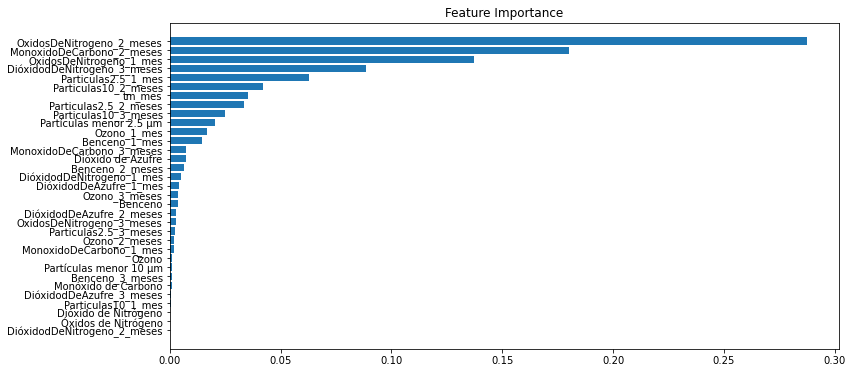

In [ ]:
feature_importance = final_model_xgb.feature_importances_
sorted_idx = np.argsort(feature_importance)
fig = plt.figure(figsize=(12, 6))
plt.barh(range(len(sorted_idx)), feature_importance[sorted_idx], align='center')
plt.yticks(range(len(sorted_idx)), np.array(X_test.columns)[sorted_idx])
plt.title('Feature Importance')

In [ ]:
preds1=final_model_xgb.predict(X_test)

In [ ]:
rmse_xgb, mae_xgb,mape_xgb=np.sqrt(mean_squared_error(preds1,y_test)),mean_absolute_error(preds1,y_test),mean_absolute_percentage_error(preds1,y_test)

In [ ]:
errores_xgb=[ mae_xgb,mape_xgb,rmse_xgb]
print(errores_xgb)

[10.24490247453962, 0.12317540140716876, 13.467874937943174]


ntree_limit is deprecated, use `iteration_range` or model slicing instead.


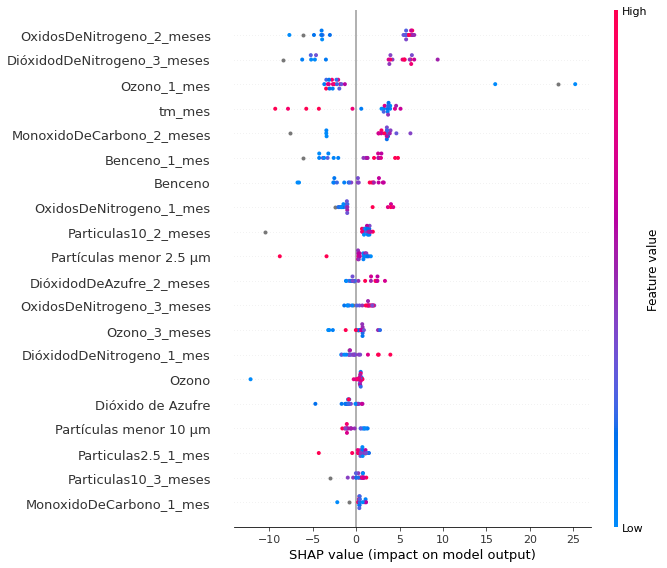

In [ ]:
explainer = shap.TreeExplainer(final_model_xgb)
shap_values = explainer.shap_values(X_test)
shap.summary_plot(shap_values, X_test)